In [2]:
###### import os
import pandas as pd
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn as sk
import pandas_profiling

%matplotlib inline

In [3]:
plt.rcParams['figure.figsize']=10,7.5
plt.rcParams['axes.grid']=True
plt.gray()

<Figure size 720x540 with 0 Axes>

In [4]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

In [5]:
os.chdir(r"C:\Users\ASUS-PC\Downloads\Compressed\3. CREDIT CARD SPEND PREDICTION PROBLEM- BANKING-REGRESSION")

In [6]:
missing_values=['#NULL!']
credit_card_spend=pd.read_csv("CREDIT CARD USERS DATA.csv",na_values=missing_values)

In [7]:
credit_card_spend.head()

,custid,region,townsize,gender,age,agecat,birthmonth,ed,edcat,jobcat,...,owncd,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03
0,3964-QJWTRG-NPN,1.0,2.0,1.0,20.0,2.0,September,15.0,3.0,1.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
1,0648-AIPJSP-UVM,5.0,5.0,0.0,22.0,2.0,May,17.0,4.0,2.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0
2,5195-TLUDJE-HVO,3.0,4.0,1.0,67.0,6.0,June,14.0,2.0,2.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,4459-VLPQUH-3OL,4.0,3.0,0.0,23.0,2.0,May,16.0,3.0,2.0,...,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0
4,8158-SMTQFB-CNO,2.0,2.0,0.0,26.0,3.0,July,16.0,3.0,2.0,...,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0


In [8]:
credit_card_spend.columns

Index(['custid', 'region', 'townsize', 'gender', 'age', 'agecat', 'birthmonth',
       'ed', 'edcat', 'jobcat',
       ...
       'owncd', 'ownpda', 'ownpc', 'ownipod', 'owngame', 'ownfax', 'news',
       'response_01', 'response_02', 'response_03'],
      dtype='object', length=132)

In [9]:
credit_card_spend.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Columns: 132 entries, custid to response_03
dtypes: float64(130), object(2)
memory usage: 5.0+ MB


# Calculate total spend on card

In [10]:
credit_card_spend['total_spent_on_card'] = credit_card_spend['cardspent'] + credit_card_spend['card2spent']

In [11]:
credit_card_spend.drop(['cardspent','card2spent'],axis=1,inplace=True)

In [12]:
credit_card_spend.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Columns: 131 entries, custid to total_spent_on_card
dtypes: float64(129), object(2)
memory usage: 5.0+ MB


In [13]:
credit_card_spend.describe().T

,count,mean,std,min,25%,50%,75%,max
region,5000.0,3.001400,1.421760,1.00,2.0000,3.00,4.0000,5.00
townsize,4998.0,2.687275,1.425925,1.00,1.0000,3.00,4.0000,5.00
gender,5000.0,0.503600,0.500037,0.00,0.0000,1.00,1.0000,1.00
age,5000.0,47.025600,17.770338,18.00,31.0000,47.00,62.0000,79.00
agecat,5000.0,4.238800,1.308785,2.00,3.0000,4.00,5.0000,6.00
...,...,...,...,...,...,...,...,...
news,5000.0,0.472600,0.499299,0.00,0.0000,0.00,1.0000,1.00
response_01,5000.0,0.083600,0.276815,0.00,0.0000,0.00,0.0000,1.00
response_02,5000.0,0.129800,0.336117,0.00,0.0000,0.00,0.0000,1.00
response_03,5000.0,0.102600,0.303466,0.00,0.0000,0.00,0.0000,1.00


# Categories the data into numerical and categorical

In [14]:
numeric_vars=[key for key in dict(credit_card_spend.dtypes) if dict(credit_card_spend.dtypes)[key] in ['int32','int64','float32','float64']]
cat_vars=[key for key in dict(credit_card_spend.dtypes) if dict(credit_card_spend.dtypes)[key] in ['object','O']]

In [15]:
credit_card_spend.isnull().any().head()

custid      False
region      False
townsize     True
gender      False
age         False
dtype: bool

In [16]:
credit_card_spend_num=credit_card_spend[numeric_vars]
credit_card_spend_num.head()

,region,townsize,gender,age,agecat,ed,edcat,jobcat,union,employ,...,ownpda,ownpc,ownipod,owngame,ownfax,news,response_01,response_02,response_03,total_spent_on_card
0,1.0,2.0,1.0,20.0,2.0,15.0,3.0,1.0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,149.46
1,5.0,5.0,0.0,22.0,2.0,17.0,4.0,2.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,77.54
2,3.0,4.0,1.0,67.0,6.0,14.0,2.0,2.0,0.0,16.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,359.97
3,4.0,3.0,0.0,23.0,2.0,16.0,3.0,2.0,0.0,0.0,...,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,359.41
4,2.0,2.0,0.0,26.0,3.0,16.0,3.0,2.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,507.83


In [17]:
credit_card_spend_cat=credit_card_spend[cat_vars]
credit_card_spend_cat.head()

,custid,birthmonth
0,3964-QJWTRG-NPN,September
1,0648-AIPJSP-UVM,May
2,5195-TLUDJE-HVO,June
3,4459-VLPQUH-3OL,May
4,8158-SMTQFB-CNO,July


In [18]:
credit_card_spend_cat.drop(['custid'],axis=1,inplace=True)

C:\Users\ASUS-PC\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [19]:
credit_card_spend_cat.head()

,birthmonth
0,September
1,May
2,June
3,May
4,July


# Calculate Basic statistics for observe the data

In [20]:
def var_summary(x):
    return pd.Series([x.count(),x.isnull().sum(),x.sum(),x.mean(),x.median(),x.std(),x.var(),x.var()/x.mean(),x.min(),x.quantile(0.01), x.quantile(0.05),x.quantile(0.10),x.quantile(0.25),x.quantile(0.50),x.quantile(0.75), x.quantile(0.90),x.quantile(0.95), x.quantile(0.99),x.max()], 
                  index=['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR','CV', 'MIN', 'P1' , 'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])

In [21]:
credit_card_spend_num.apply(var_summary).T


,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,CV,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
region,5000.0,0.0,15007.00,3.001400,3.00,1.421760,2.021402,0.673486,1.00,1.0000,1.000,1.000,2.0000,3.00,4.0000,5.000,5.0000,5.0000,5.00
townsize,4998.0,2.0,13431.00,2.687275,3.00,1.425925,2.033262,0.756626,1.00,1.0000,1.000,1.000,1.0000,3.00,4.0000,5.000,5.0000,5.0000,5.00
gender,5000.0,0.0,2518.00,0.503600,1.00,0.500037,0.250037,0.496499,0.00,0.0000,0.000,0.000,0.0000,1.00,1.0000,1.000,1.0000,1.0000,1.00
age,5000.0,0.0,235128.00,47.025600,47.00,17.770338,315.784902,6.715170,18.00,18.0000,20.000,23.000,31.0000,47.00,62.0000,72.000,76.0000,79.0000,79.00
agecat,5000.0,0.0,21194.00,4.238800,4.00,1.308785,1.712917,0.404104,2.00,2.0000,2.000,2.000,3.0000,4.00,5.0000,6.000,6.0000,6.0000,6.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
news,5000.0,0.0,2363.00,0.472600,0.00,0.499299,0.249299,0.527506,0.00,0.0000,0.000,0.000,0.0000,0.00,1.0000,1.000,1.0000,1.0000,1.00
response_01,5000.0,0.0,418.00,0.083600,0.00,0.276815,0.076626,0.916583,0.00,0.0000,0.000,0.000,0.0000,0.00,0.0000,0.000,1.0000,1.0000,1.00
response_02,5000.0,0.0,649.00,0.129800,0.00,0.336117,0.112975,0.870374,0.00,0.0000,0.000,0.000,0.0000,0.00,0.0000,1.000,1.0000,1.0000,1.00
response_03,5000.0,0.0,513.00,0.102600,0.00,0.303466,0.092092,0.897580,0.00,0.0000,0.000,0.000,0.0000,0.00,0.0000,1.000,1.0000,1.0000,1.00


In [22]:
def cat_summary(x):
    return pd.Series([x.count(),x.isnull().sum(),x.value_counts()],
              index=['N','NMISS','ColumnNames']) 
credit_card_spend_cat.apply(cat_summary)

,birthmonth
N,5000
NMISS,0
ColumnNames,September 458 May 451 January ...


In [23]:
credit_card_spend['total_spent_on_card'].quantile(0.99)

1760.1024000000018

In [24]:
credit_card_spend['total_spent_on_card'].quantile(0.01)

58.1976

In [26]:
credit_card_spend['total_spent_on_card']=credit_card_spend['total_spent_on_card'].clip_upper(credit_card_spend['total_spent_on_card'].quantile(0.99))

credit_card_spend['total_spent_on_card']=credit_card_spend['total_spent_on_card'].clip_upper(credit_card_spend['total_spent_on_card'].quantile(0.01))

AttributeError: 'Series' object has no attribute 'clip_upper'

# Outlier treatment

In [27]:
def outlier_handling(x):
    x=x.clip_upper(x.quantile(0.99))
    x=x.clip_lower(x.quantile(0.01))
    return x
credit_card_spend_num=credit_card_spend_num.apply(outlier_handling)

AttributeError: 'Series' object has no attribute 'clip_upper'

# Missing value treatment with median

In [26]:
def missing_handling(x):
    x=x.fillna(x.median())
    return x
credit_card_spend_num=credit_card_spend_num.apply(missing_handling)

In [27]:
credit_card_spend_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Columns: 129 entries, region to total_spent_on_card
dtypes: float64(129)
memory usage: 4.9 MB


# Create dummy variables for categorical data

In [19]:
def create_dummies( df, colname ):
    col_dummies = pd.get_dummies(df[colname], prefix=colname)
    col_dummies.drop(col_dummies.columns[0], axis=1, inplace=True)
    df = pd.concat([df, col_dummies], axis=1)
    df.drop( colname, axis = 1, inplace = True )
    return df

In [21]:
create_dummies(credit_card_spend_cat,birthmonth)

NameError: name 'df' is not defined

In [17]:
for c_feature in credit_card_spend_cat:
    credit_card_spend_cat = create_dummies(credit_card_spend_cat,c_feature)

In [18]:
credit_card_spend_cat.head()

,birthmonth_August,birthmonth_December,birthmonth_February,birthmonth_January,birthmonth_July,birthmonth_June,birthmonth_March,birthmonth_May,birthmonth_November,birthmonth_October,birthmonth_September
0,0,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,1,0,0,0
2,0,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0


# Joining both the data set

In [31]:
credit_card_spend_new=pd.concat([credit_card_spend_num,credit_card_spend_cat],axis=1)

In [32]:
credit_card_spend_new.head()

,region,townsize,gender,age,agecat,ed,edcat,jobcat,union,employ,...,birthmonth_December,birthmonth_February,birthmonth_January,birthmonth_July,birthmonth_June,birthmonth_March,birthmonth_May,birthmonth_November,birthmonth_October,birthmonth_September
0,1.0,2.0,1.0,20.0,2.0,15.0,3.0,1.0,1.0,0.0,...,0,0,0,0,0,0,0,0,0,1
1,5.0,5.0,0.0,22.0,2.0,17.0,4.0,2.0,0.0,0.0,...,0,0,0,0,0,0,1,0,0,0
2,3.0,4.0,1.0,67.0,6.0,14.0,2.0,2.0,0.0,16.0,...,0,0,0,0,1,0,0,0,0,0
3,4.0,3.0,0.0,23.0,2.0,16.0,3.0,2.0,0.0,0.0,...,0,0,0,0,0,0,1,0,0,0
4,2.0,2.0,0.0,26.0,3.0,16.0,3.0,2.0,0.0,1.0,...,0,0,0,1,0,0,0,0,0,0


In [33]:
report=pandas_profiling.ProfileReport(credit_card_spend_new)
report

# Drop those variables whose are rejected by pandas profilling or they are less significant for the mode

In [34]:
rejected=report.get_rejected_variables()

In [35]:
credit_card_spend_new.drop(rejected,axis=1,inplace=True)

In [36]:
credit_card_spend_new.head()

,region,townsize,gender,age,ed,jobcat,union,empcat,retire,income,...,birthmonth_December,birthmonth_February,birthmonth_January,birthmonth_July,birthmonth_June,birthmonth_March,birthmonth_May,birthmonth_November,birthmonth_October,birthmonth_September
0,1.0,2.0,1.0,20.0,15.0,1.0,1.0,1.0,0.0,31.0,...,0,0,0,0,0,0,0,0,0,1
1,5.0,5.0,0.0,22.0,17.0,2.0,0.0,1.0,0.0,15.0,...,0,0,0,0,0,0,1,0,0,0
2,3.0,4.0,1.0,67.0,14.0,2.0,0.0,5.0,0.0,35.0,...,0,0,0,0,1,0,0,0,0,0
3,4.0,3.0,0.0,23.0,16.0,2.0,0.0,1.0,0.0,20.0,...,0,0,0,0,0,0,1,0,0,0
4,2.0,2.0,0.0,26.0,16.0,2.0,0.0,1.0,0.0,23.0,...,0,0,0,1,0,0,0,0,0,0


In [37]:
credit_card_spend_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Columns: 124 entries, region to birthmonth_September
dtypes: float64(113), uint8(11)
memory usage: 4.4 MB


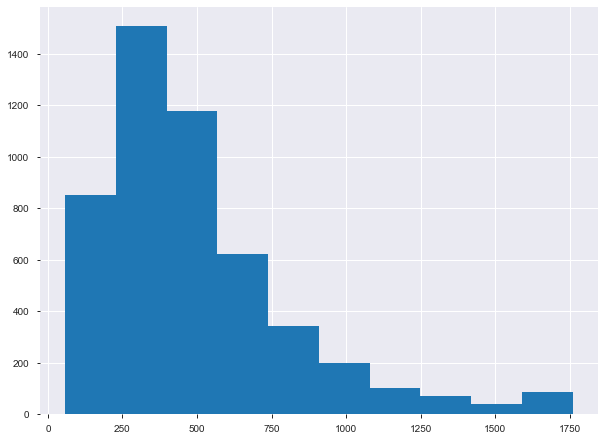

In [38]:
credit_card_spend_new.total_spent_on_card.hist()

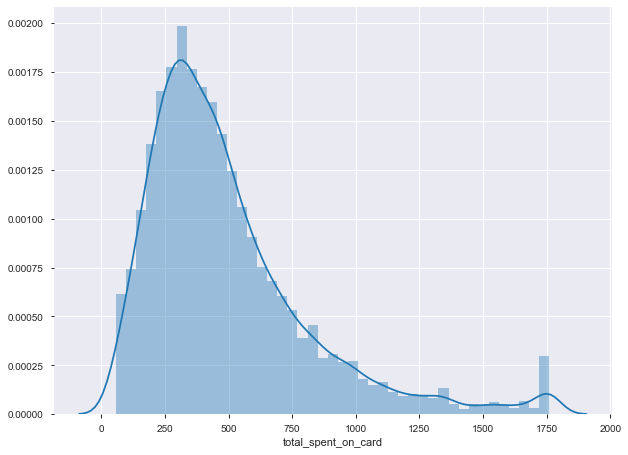

In [39]:
sns.distplot(credit_card_spend_new.total_spent_on_card)

# Taking the log transformation because the response variable not following normal assumptions

In [40]:
credit_card_spend_new['ln_total_spent_on_card']=np.log(credit_card_spend_new.total_spent_on_card)

In [41]:
credit_card_spend_new.drop(["total_spent_on_card"],axis=1,inplace=True)

In [42]:
credit_card_spend_new.head()

,region,townsize,gender,age,ed,jobcat,union,empcat,retire,income,...,birthmonth_February,birthmonth_January,birthmonth_July,birthmonth_June,birthmonth_March,birthmonth_May,birthmonth_November,birthmonth_October,birthmonth_September,ln_total_spent_on_card
0,1.0,2.0,1.0,20.0,15.0,1.0,1.0,1.0,0.0,31.0,...,0,0,0,0,0,0,0,0,1,5.007029
1,5.0,5.0,0.0,22.0,17.0,2.0,0.0,1.0,0.0,15.0,...,0,0,0,0,0,1,0,0,0,4.350794
2,3.0,4.0,1.0,67.0,14.0,2.0,0.0,5.0,0.0,35.0,...,0,0,0,1,0,0,0,0,0,5.886021
3,4.0,3.0,0.0,23.0,16.0,2.0,0.0,1.0,0.0,20.0,...,0,0,0,0,0,1,0,0,0,5.884464
4,2.0,2.0,0.0,26.0,16.0,2.0,0.0,1.0,0.0,23.0,...,0,0,1,0,0,0,0,0,0,6.230147


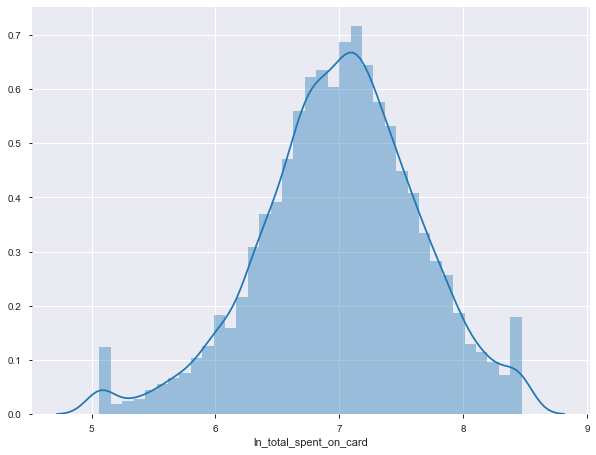

In [43]:
sns.distplot(credit_card_spend_new["ln_total_spent_on_card"]+1)

In [44]:
correlation=credit_card_spend_new.corr()
correlation

,region,townsize,gender,age,ed,jobcat,union,empcat,retire,income,...,birthmonth_February,birthmonth_January,birthmonth_July,birthmonth_June,birthmonth_March,birthmonth_May,birthmonth_November,birthmonth_October,birthmonth_September,ln_total_spent_on_card
region,1.000000,0.414026,-0.012810,-0.026525,0.013850,-0.004717,-0.013768,-0.009345,-0.042849,0.036594,...,-0.015546,0.002745,0.020658,0.005281,0.000722,0.021298,-0.012231,-0.011575,0.019683,0.039216
townsize,0.414026,1.000000,0.009576,-0.075399,0.002968,-0.010768,-0.019846,-0.058059,-0.065779,-0.009478,...,-0.024500,-0.008957,0.001582,0.005711,0.002053,-0.000498,-0.019298,0.020539,0.011270,0.006132
gender,-0.012810,0.009576,1.000000,-0.010186,-0.000777,-0.016470,0.000311,-0.013842,-0.021040,-0.001949,...,0.015168,0.000704,-0.013059,0.007914,0.022453,-0.009947,0.005998,-0.003610,-0.025860,-0.078605
age,-0.026525,-0.075399,-0.010186,1.000000,-0.093966,0.037709,0.011206,0.739573,0.567519,0.208286,...,0.019207,-0.005793,0.020012,0.010682,0.013504,-0.017742,0.008049,-0.029846,-0.012905,0.007270
ed,0.013850,0.002968,-0.000777,-0.093966,1.000000,-0.072855,0.000273,-0.197841,-0.092627,0.186802,...,-0.021278,0.009659,-0.002186,0.001654,-0.008574,-0.020765,0.016814,0.025154,-0.008178,0.098077
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
birthmonth_May,0.021298,-0.000498,-0.009947,-0.017742,-0.020765,0.017472,-0.010117,-0.012301,-0.005054,-0.014965,...,-0.095102,-0.095350,-0.094480,-0.095350,-0.094854,1.000000,-0.092724,-0.094106,-0.099986,-0.003625
birthmonth_November,-0.012231,-0.019298,0.005998,0.008049,0.016814,-0.030736,0.005503,-0.006657,-0.016422,0.017384,...,-0.088945,-0.089177,-0.088363,-0.089177,-0.088712,-0.092724,1.000000,-0.088013,-0.093512,0.007104
birthmonth_October,-0.011575,0.020539,-0.003610,-0.029846,0.025154,-0.005306,-0.020332,-0.035800,-0.001060,-0.013342,...,-0.090271,-0.090506,-0.089680,-0.090506,-0.090035,-0.094106,-0.088013,1.000000,-0.094906,-0.000069
birthmonth_September,0.019683,0.011270,-0.025860,-0.012905,-0.008178,0.020834,-0.023708,-0.007219,0.010554,-0.023206,...,-0.095911,-0.096161,-0.095284,-0.096161,-0.095661,-0.099986,-0.093512,-0.094906,1.000000,-0.007363


In [45]:
p=pd.Series(correlation["ln_total_spent_on_card"]).sort_values(ascending=False)
p.head(30)                                                                                

ln_total_spent_on_card    1.000000
card2items                0.521198
carditems                 0.501884
inccat                    0.381432
income                    0.355851
carvalue                  0.306784
lnothdebt                 0.273831
othdebt                   0.260441
lncreddebt                0.252918
creddebt                  0.233355
carcatvalue               0.206702
owndvd                    0.164081
ownvcr                    0.156810
owncd                     0.147648
ed                        0.098077
wireten                   0.097513
empcat                    0.096982
tollten                   0.086512
owntv                     0.085161
equipten                  0.081837
tollmon                   0.075056
carown                    0.074207
wireless                  0.074040
internet                  0.073999
ownpda                    0.070050
homeown                   0.069823
jobsat                    0.066688
ownfax                    0.062793
lnequipmon          

# From the correlation matrix taking those variables whose have some correlation(>0.1) with the total spend

In [46]:
imp_columns=['ln_total_spent_on_card','card2items','carditems','inccat','income','carvalue','lnothdebt','othdebt','lncreddebt','creddebt','carcatvalue','owndvd','ownvcr','owncd']

In [47]:
credit_card_spend_new=credit_card_spend_new[imp_columns]


In [48]:
credit_card_spend_new.head()

,ln_total_spent_on_card,card2items,carditems,inccat,income,carvalue,lnothdebt,othdebt,lncreddebt,creddebt,carcatvalue,owndvd,ownvcr,owncd
0,5.007029,4.0,5.0,2.0,31.0,14.3,0.81,2.24,0.1800,1.20,1.0,1.0,1.0,0.0
1,4.350794,2.0,5.0,1.0,15.0,6.8,0.45,1.57,0.2000,1.22,1.0,1.0,1.0,1.0
2,5.886021,7.0,9.0,2.0,35.0,18.8,0.93,2.54,-0.0700,0.93,1.0,1.0,1.0,1.0
3,5.884464,1.0,17.0,1.0,20.0,8.7,0.11,1.12,-3.4002,0.03,1.0,1.0,1.0,1.0
4,6.230147,7.0,8.0,1.0,23.0,10.6,-1.74,0.18,-1.5400,0.21,1.0,1.0,1.0,1.0


# Splitting the data into train and test

In [49]:
train,test=train_test_split(credit_card_spend_new,test_size=0.3,random_state=1234)

In [50]:
len(train)

3500

In [51]:
len(test)

1500

In [52]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3500 entries, 4735 to 2863
Data columns (total 14 columns):
ln_total_spent_on_card    3500 non-null float64
card2items                3500 non-null float64
carditems                 3500 non-null float64
inccat                    3500 non-null float64
income                    3500 non-null float64
carvalue                  3500 non-null float64
lnothdebt                 3500 non-null float64
othdebt                   3500 non-null float64
lncreddebt                3500 non-null float64
creddebt                  3500 non-null float64
carcatvalue               3500 non-null float64
owndvd                    3500 non-null float64
ownvcr                    3500 non-null float64
owncd                     3500 non-null float64
dtypes: float64(14)
memory usage: 410.2 KB


In [53]:
import statsmodels.formula.api as smf

In [54]:
lm=smf.ols('ln_total_spent_on_card ~ card2items+carditems+inccat+income+owncd',data=train).fit()

In [55]:
print(lm.summary())

                              OLS Regression Results                              
Dep. Variable:     ln_total_spent_on_card   R-squared:                       0.595
Model:                                OLS   Adj. R-squared:                  0.594
Method:                     Least Squares   F-statistic:                     1025.
Date:                    Tue, 05 Jan 2021   Prob (F-statistic):               0.00
Time:                            01:44:45   Log-Likelihood:                -1878.2
No. Observations:                    3500   AIC:                             3768.
Df Residuals:                        3494   BIC:                             3805.
Df Model:                               5                                         
Covariance Type:                nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   

# Checking the multicollinearity

In [60]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices

In [90]:
y,X=dmatrices('ln_total_spent_on_card~card2items+carditems+inccat+income+lnothdebt+othdebt+lncreddebt+creddebt+carcatvalue+owndvd+ownvcr+owncd',data=train,return_type='dataframe')

In [91]:
vif=pd.DataFrame()
vif["VIF_FActor"]=[variance_inflation_factor(X.values,i) for i in range(X.shape[1])]
vif["features"]=X.columns

In [92]:
vif.round(1)

,VIF_FActor,features
0,34.6,Intercept
1,1.0,card2items
2,1.0,carditems
3,6.3,inccat
4,6.7,income
5,4.5,lnothdebt
6,4.4,othdebt
7,3.6,lncreddebt
8,3.5,creddebt
9,1.5,carcatvalue


# Predict the value for the train data

In [64]:
train['pred_ln_total_spent_on_card']=lm.predict(train)

In [65]:
train.head()

,ln_total_spent_on_card,card2items,carditems,inccat,income,carvalue,lnothdebt,othdebt,lncreddebt,creddebt,carcatvalue,owndvd,ownvcr,owncd,pred_ln_total_spent_on_card
4735,7.009472,7.0,15.0,4.0,113.0,57.6,3.1802,24.0618,0.30,1.35,3.0,1.0,1.0,1.0,6.974546
1796,5.855101,3.0,9.0,4.0,89.0,58.9,1.1700,3.2300,0.51,1.66,3.0,1.0,1.0,1.0,5.956325
479,5.765567,6.0,9.0,5.0,147.0,82.8,1.8900,6.6500,2.46,11.72,3.0,1.0,1.0,1.0,6.522031
2524,6.005318,5.0,9.0,2.0,32.0,16.6,1.4100,4.1100,-0.41,0.66,1.0,1.0,1.0,1.0,5.868928
1565,5.001527,0.0,12.0,2.0,34.0,16.0,-0.4700,0.6200,0.67,1.96,1.0,1.0,1.0,1.0,5.537436


# Predict the value for the test data

In [66]:
test['pred_ln_total_spent_on_card']=lm.predict(test)

In [67]:
test.head()

,ln_total_spent_on_card,card2items,carditems,inccat,income,carvalue,lnothdebt,othdebt,lncreddebt,creddebt,carcatvalue,owndvd,ownvcr,owncd,pred_ln_total_spent_on_card
2706,6.234509,7.0,9.0,3.0,53.00,18.9,-0.03,0.97,0.14,1.15,1.0,1.0,1.0,1.0,6.252241
2436,5.847796,6.0,8.0,2.0,31.00,10.6,0.29,1.34,-0.18,0.83,1.0,1.0,1.0,1.0,5.900453
1201,5.396714,1.0,11.0,1.0,12.00,5.5,0.36,1.44,-0.51,0.60,1.0,1.0,1.0,1.0,5.420816
1486,6.978968,10.0,15.0,1.0,22.00,10.6,0.61,1.84,-0.76,0.47,1.0,0.0,1.0,1.0,6.833817
4286,6.617309,3.0,10.0,5.0,272.01,80.3,2.70,14.91,0.05,1.05,3.0,1.0,1.0,1.0,6.472558


# Convert the log total spend to its original form

In [68]:
train['actual_total_spent_on_card']=np.exp(train.ln_total_spent_on_card)
test['actual_total_spent_on_card']=np.exp(test.ln_total_spent_on_card)

train['pred_total_spent_on_card']=np.exp(train.pred_ln_total_spent_on_card)
test['pred_total_spent_on_card']=np.exp(test.pred_ln_total_spent_on_card)

In [69]:
train.head()

,ln_total_spent_on_card,card2items,carditems,inccat,income,carvalue,lnothdebt,othdebt,lncreddebt,creddebt,carcatvalue,owndvd,ownvcr,owncd,pred_ln_total_spent_on_card,actual_total_spent_on_card,pred_total_spent_on_card
4735,7.009472,7.0,15.0,4.0,113.0,57.6,3.1802,24.0618,0.30,1.35,3.0,1.0,1.0,1.0,6.974546,1107.07,1069.071399
1796,5.855101,3.0,9.0,4.0,89.0,58.9,1.1700,3.2300,0.51,1.66,3.0,1.0,1.0,1.0,5.956325,349.01,386.188262
479,5.765567,6.0,9.0,5.0,147.0,82.8,1.8900,6.6500,2.46,11.72,3.0,1.0,1.0,1.0,6.522031,319.12,679.958213
2524,6.005318,5.0,9.0,2.0,32.0,16.6,1.4100,4.1100,-0.41,0.66,1.0,1.0,1.0,1.0,5.868928,405.58,353.869597
1565,5.001527,0.0,12.0,2.0,34.0,16.0,-0.4700,0.6200,0.67,1.96,1.0,1.0,1.0,1.0,5.537436,148.64,254.025838


In [70]:
test.head()

,ln_total_spent_on_card,card2items,carditems,inccat,income,carvalue,lnothdebt,othdebt,lncreddebt,creddebt,carcatvalue,owndvd,ownvcr,owncd,pred_ln_total_spent_on_card,actual_total_spent_on_card,pred_total_spent_on_card
2706,6.234509,7.0,9.0,3.0,53.00,18.9,-0.03,0.97,0.14,1.15,1.0,1.0,1.0,1.0,6.252241,510.05,519.174967
2436,5.847796,6.0,8.0,2.0,31.00,10.6,0.29,1.34,-0.18,0.83,1.0,1.0,1.0,1.0,5.900453,346.47,365.202830
1201,5.396714,1.0,11.0,1.0,12.00,5.5,0.36,1.44,-0.51,0.60,1.0,1.0,1.0,1.0,5.420816,220.68,226.063410
1486,6.978968,10.0,15.0,1.0,22.00,10.6,0.61,1.84,-0.76,0.47,1.0,0.0,1.0,1.0,6.833817,1073.81,928.729030
4286,6.617309,3.0,10.0,5.0,272.01,80.3,2.70,14.91,0.05,1.05,3.0,1.0,1.0,1.0,6.472558,747.93,647.137138


In [71]:
import scipy.stats as stats

# Calculate the MAPE, RMSE and Correlation for both the train and test data

In [72]:
MAPE_train=np.mean(np.abs((train.actual_total_spent_on_card-train.pred_total_spent_on_card)/train.actual_total_spent_on_card))
print(MAPE_train)

RMSE_train=mean_squared_error(train.actual_total_spent_on_card,train.pred_total_spent_on_card)
print(RMSE_train)

corr_train=stats.stats.pearsonr(train.actual_total_spent_on_card,train.pred_total_spent_on_card)
print(corr_train)




MAPE_test=np.mean(np.abs((test.actual_total_spent_on_card-test.pred_total_spent_on_card)/test.actual_total_spent_on_card))
print(MAPE_test)

RMSE_test=mean_squared_error(test.actual_total_spent_on_card,test.pred_total_spent_on_card)
print(RMSE_test)

corr_test=stats.stats.pearsonr(test.actual_total_spent_on_card,test.pred_total_spent_on_card)
print(corr_test)

0.33823371642714894
65311.43402502187
(0.64802779511018, 0.0)
0.3380093726316522
62700.43225373934
(0.6135731340872946, 7.462534597258281e-156)


In [73]:
lm.resid


4735    0.034926
1796   -0.101224
479    -0.756464
2524    0.136390
1565   -0.535909
          ...   
664     0.195735
3276   -0.394070
1318    0.252210
723    -0.026908
2863    0.161747
Length: 3500, dtype: float64

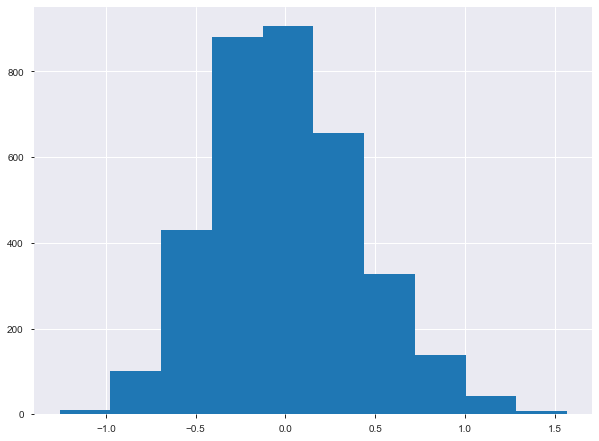

In [74]:
lm.resid.hist()

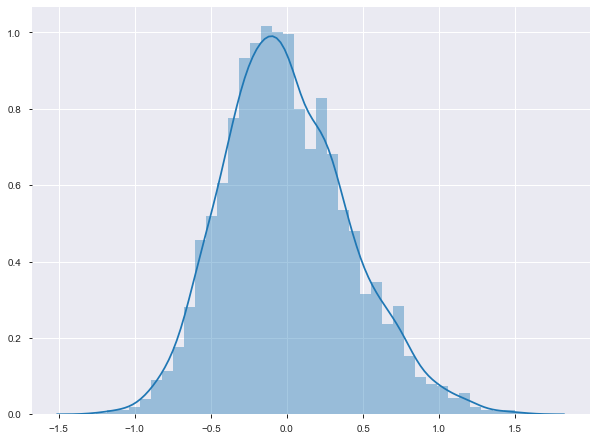

In [76]:
sns.distplot(lm.resid)

In [83]:
#corr actual & resid
stats.pearsonr(train.ln_total_spent_on_card,lm.resid)

(0.6367506161572943, 0.0)